# Advanced Lane Detection

The goals / steps of this project are the following:

* [DONE] Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* [DONE] Apply a distortion correction to raw images.
* [DONE] Use color transforms, gradients, etc., to create a thresholded binary image.
* [DONE] Apply a perspective transform to rectify binary image ("birds-eye view").
* [DONE] Detect lane pixels and fit to find the lane boundary.
* [DONE] Determine the curvature of the lane and vehicle position with respect to center.
* [DONE] Warp the detected lane boundaries back onto the original image.
* [DONE] Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [1]:
# Import libraries necceassary for the project
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mp
import pickle
import glob
%matplotlib inline

# Step 1: Camera Calibration

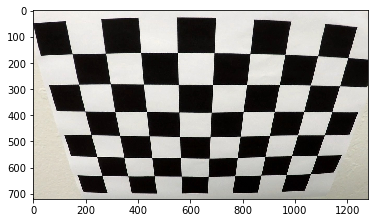

In [2]:
#import first picture
img = mp.imread('camera_cal/calibration2.jpg')
plt.imshow(img)
# Note: Looking at the files the first picture has a 9*5 layout all others have 9*6 layout.
# First file is not suitable to do a proper calibration using fixed values

In [3]:
#Read in all images from directory
images = glob.glob(('camera_cal/calibration*.jpg'))

# Arrays to hold the points fronm all images
objpoints= [] #3d real world points
imgpoints=[] #2d points on image plane

# Define corners in x / y direction
cx = 9
cy = 6


#Prepare points on chessboard in a 9x6 matrix
objp = np.zeros((cy*cx,3), np.float32)
objp[:,:2] = np.mgrid[0:cx,0:cy].T.reshape(-1,2)

for fname in images:
    img = mp.imread(fname)

    #grayscaling the picutre
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # find corner on the chessboard
    ret, corners = cv2.findChessboardCorners(gray, (cx,cy), None)

    #if corners are found append the points to the arrays
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        #draw corners on the image
        img =cv2.drawChessboardCorners(img, (cx,cy), corners, ret)
        #plt.imshow(img)
        
        ''' This section is commented out, it was just used for testing in the beginning
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (cx,cy), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title(fname, fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Show Corners', fontsize=18)
        '''

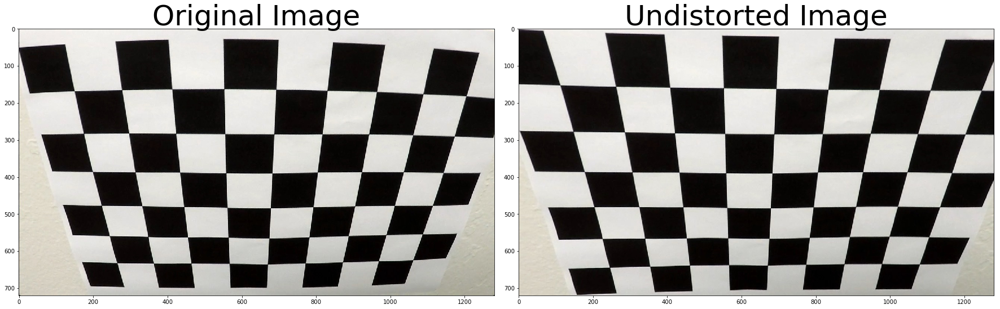

In [4]:
#define function that uses img and obj point to undistort a given image
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1:], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

#read in test image for correction
img = mp.imread('camera_cal/calibration2.jpg')
undistorted = cal_undistort(img, objpoints, imgpoints)

#show corrected image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Apply distortion correction to raw images

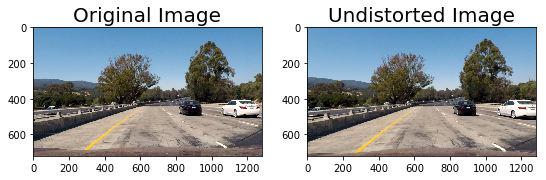

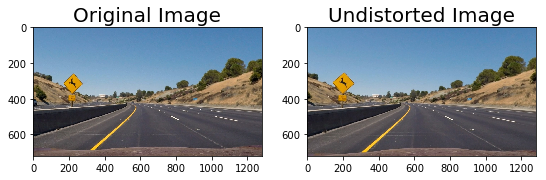

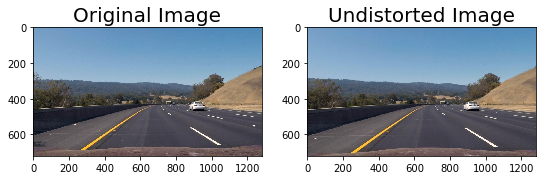

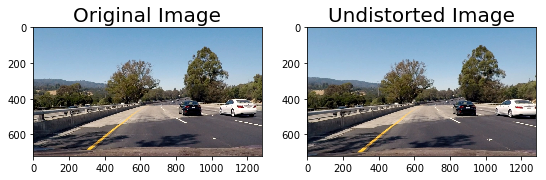

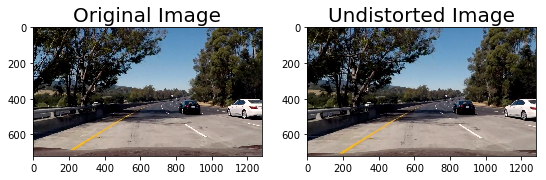

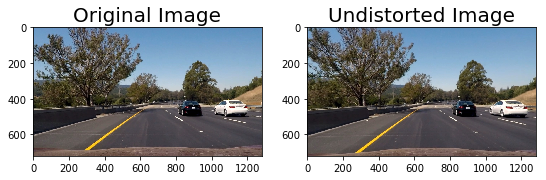

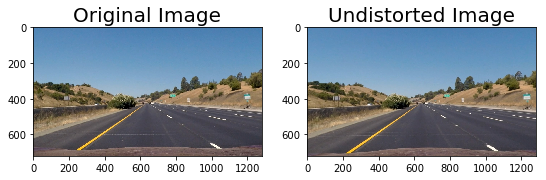

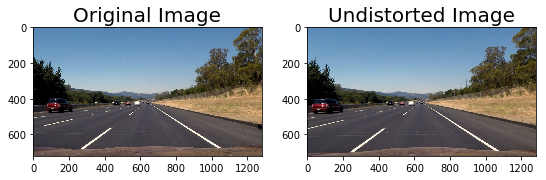

In [5]:
# Apply distortion correction to images
def distortCorrect(input_img):
    img = cv2.imread(input_img)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None) # use the points calculated in the step before
    undistort_color = cv2.undistort(img, mtx, dist, None, mtx)
    undistort = cv2.cvtColor(undistort_color, cv2.COLOR_BGR2RGB)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,6))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistort)
    ax2.set_title('Undistorted Image', fontsize=20)
    
    return undistort

#generate undistorted image for all test_files
images = glob.glob('test_images/test*.jpg')
for image in images:
    filename = os.path.basename(image)
    undistortedImage = distortCorrect(image)
    mp.imsave("output_undistorted/"+filename, undistortedImage)
    
#generate undistorted image for all test_files
images = glob.glob('test_images/straight_lines*.jpg')
for image in images:
    filename = os.path.basename(image)
    undistortedImage = distortCorrect(image)
    mp.imsave("output_undistorted/"+filename, undistortedImage)

# Step 2: Color/Gradient Transformation

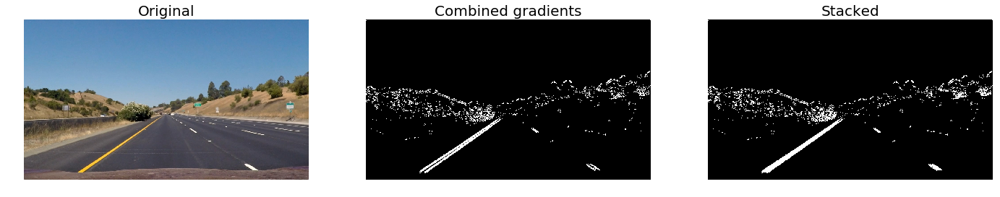

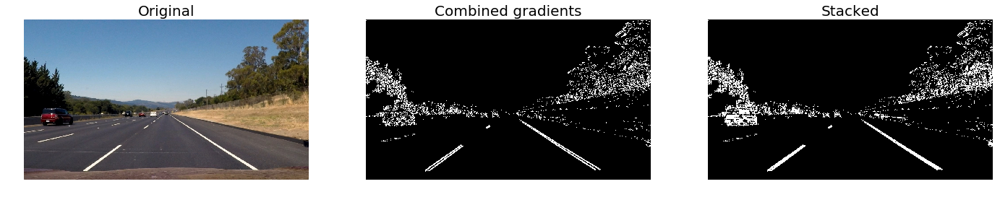

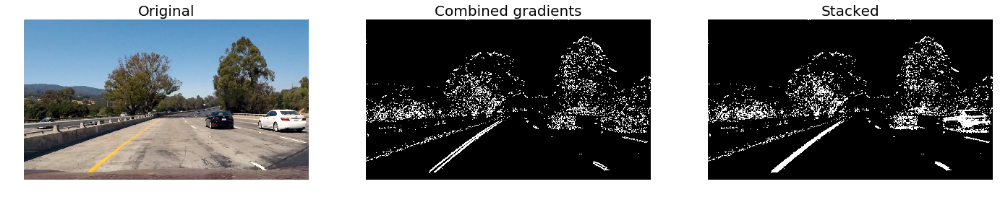

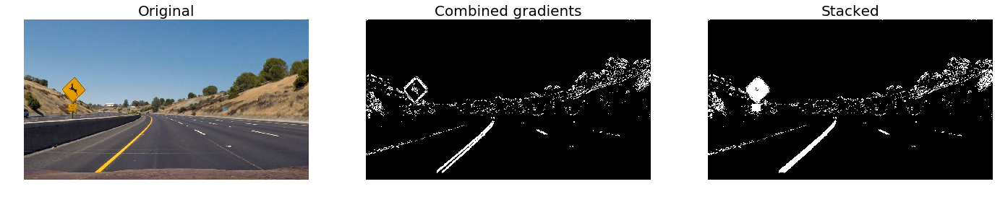

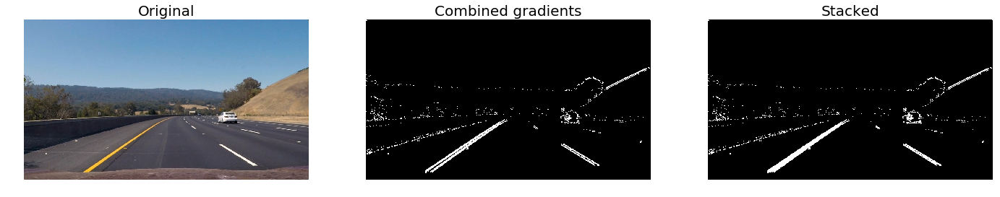

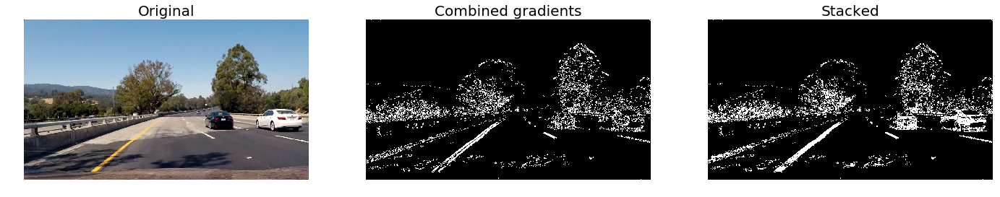

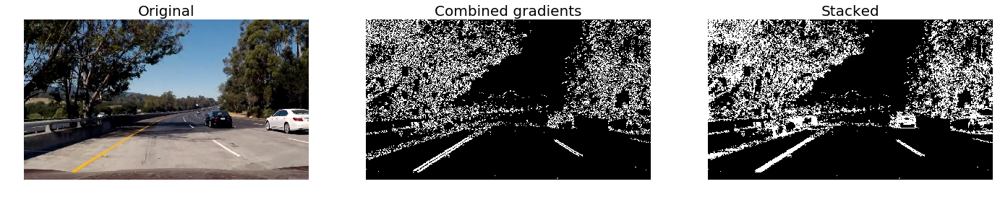

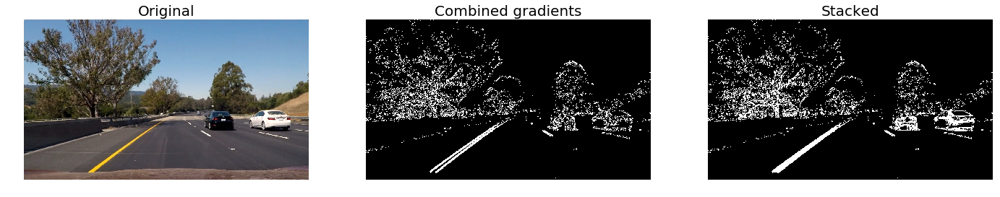

In [6]:
#Define function to get the gradients and color transform picture and get a combined overlaying image of both as output
def calculate_gradient(img):
    # Calculate directional gradient
    #define parameter for sobel and magnitude and direction
    mag_thresh = [25,215]
    sobel_kernel = 9
    direc_thresh = [0.7,1.3]
    #Use s channel instead of grayscaling
    hls = cv2.cvtColor(np.copy(img), cv2.COLOR_RGB2HLS).astype(np.float)
    # Separate and get the S channel
    gray = hls[:, :, 2]
    ## magnitude
    # 1) Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # get absolute values
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 3) Calculate magnitude
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    # 5) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*magnitude/np.max(magnitude))
    # 6) Create a binary mask where mag thresholds are met
    binary_output_magn = np.zeros_like(scaled_sobel)
    binary_output_magn[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
        
    ## direction
    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    binary_output_direc =  np.zeros_like(absgraddir)
    binary_output_direc[(absgraddir >= direc_thresh[0]) & (absgraddir <= direc_thresh[1])] = 1
    
    ## absolute
    scaled_sobel_x = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    scaled_sobel_y = np.uint8(255*abs_sobely/np.max(abs_sobely))
    # 5) Create a mask of 1's where the scaled gradient magnitude is > thresh_min and < thresh_max
    binary_output_absolute_x = np.zeros_like(scaled_sobel_x)
    binary_output_absolute_x[(scaled_sobel_x >= mag_thresh[0]) & (scaled_sobel_x <= mag_thresh[1])] = 1
    
    binary_output_absolute_y = np.zeros_like(scaled_sobel_y)
    binary_output_absolute_y[(scaled_sobel_y >= mag_thresh[0]) & (scaled_sobel_y <= mag_thresh[1])] = 1
    
    combined_gradient = np.zeros_like(binary_output_direc)
    combined_gradient[((binary_output_absolute_x == 1) & (binary_output_absolute_y == 1)) | ((binary_output_magn == 1) & (binary_output_direc == 1))] = 1
    
    return combined_gradient

def calculate_color_gradient(img):
    thresh=[150,255]
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output_s = np.zeros_like(s_channel)
    binary_output_s[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output_s

for image in glob.glob('test_images/*.jpg'):
    img = mp.imread(image)
    gradients = calculate_gradient(img)
    
    s_channel = calculate_color_gradient(img)
    
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(gradients), gradients, s_channel)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(gradients)
    combined_binary[(s_channel == 1) | (gradients == 1)] = 1
    
    
    f, (x1, x2, x3) = plt.subplots(1, 3, figsize=(24, 9))
    x1.axis('off')
    x1.imshow(img)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(gradients, cmap='gray')
    x2.set_title('Combined gradients', fontsize=20)

    x3.axis('off')
    x3.imshow(combined_binary, cmap='gray')
    x3.set_title('Stacked', fontsize=20)
    
    filename = os.path.basename(image)
    mp.imsave("output_binary/"+filename, combined_binary, cmap='gray')



# Step 3: Transforming Perspective Change to Bird's View

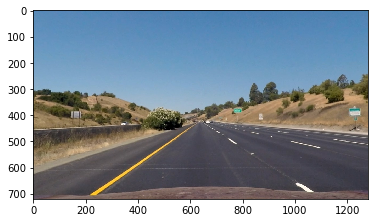

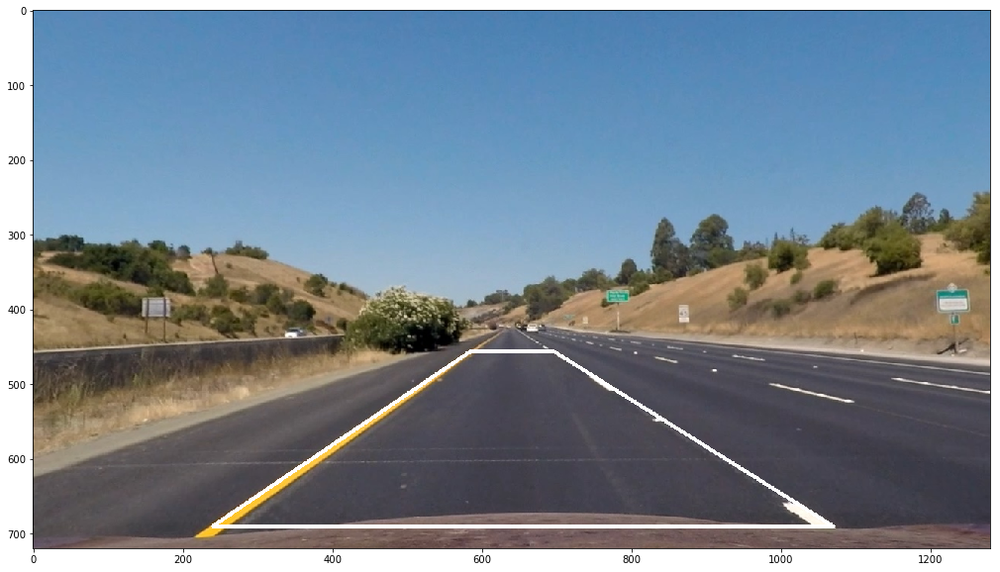

In [7]:
# using test image with straight lines for perspective transformation
img = mp.imread('output_undistorted/straight_lines1.jpg')
plt.imshow(img)
#define source points on the picture that are a rectangle
src = np.array([[(585, 456), (696, 456), (1070, 690), (240, 690)]], np.float32)

#draw lines on the picture
cv2.polylines(img, np.int32([src]), True, (255,255,0), thickness=3)
#plot the img with lines
plt.figure(figsize=(20,10))
plt.imshow(img)


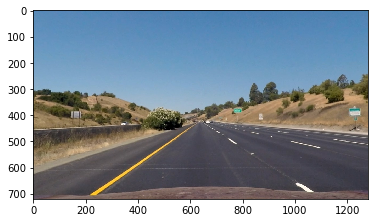

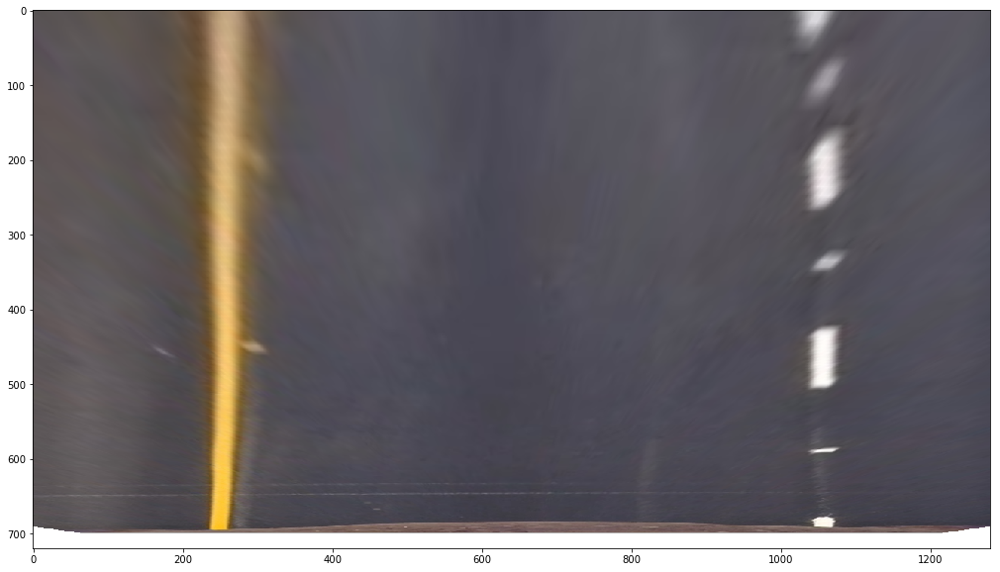

In [8]:
#read img
img = mp.imread("output_undistorted/straight_lines1.jpg")
#copy image
img_perpective = np.copy(img)
#get image size
img_size = (img.shape[1], img.shape[0])

#define offset
offset_left = 240
offset_right = 210
offset_up = 100
offset_bottom = 30

#define destination points to show warped image
dst = np.float32([[offset_left, offset_up], [img_size[0]-offset_right, offset_up], [img_size[0]-offset_right, img_size[1]-offset_bottom], [offset_left, img_size[1]-offset_bottom]])


# determine the transform matrix M and its reverse M_rev
M = cv2.getPerspectiveTransform(src, dst)
M_rev = cv2.getPerspectiveTransform(dst, src)

#calculate warped image
#warped = cv2.warpPerspective(img, M, img_size)
warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

plt.imshow(img)
plt.figure(figsize=(20,10))
plt.imshow(warped)



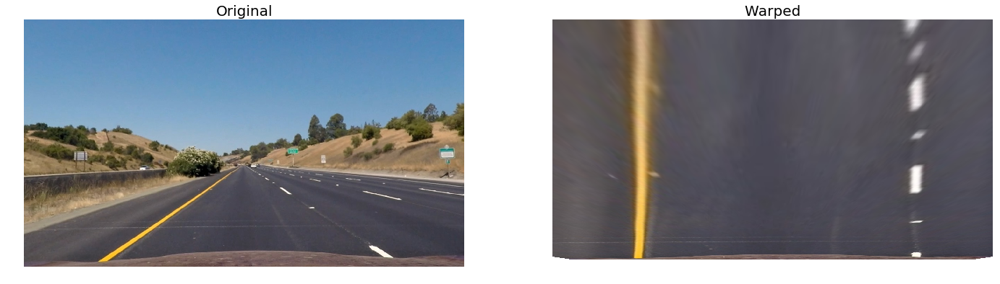

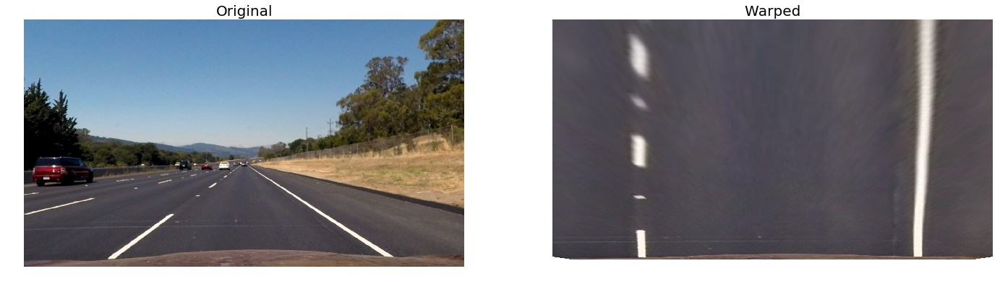

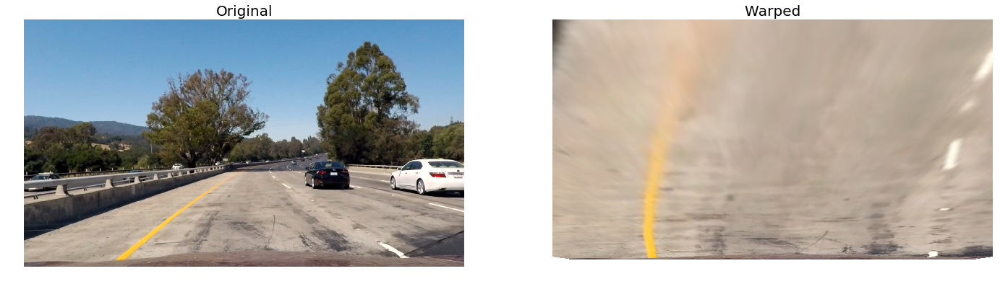

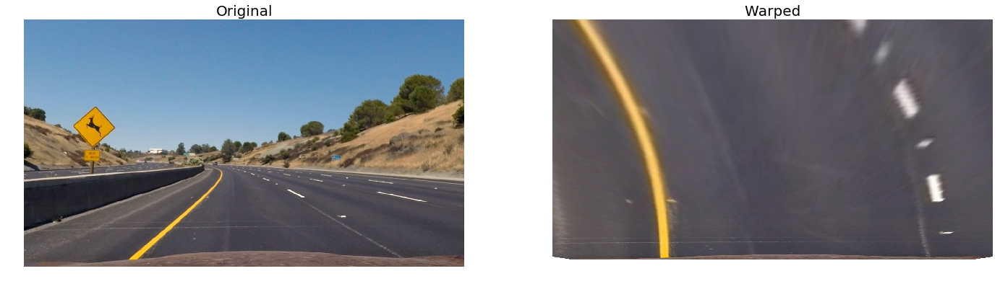

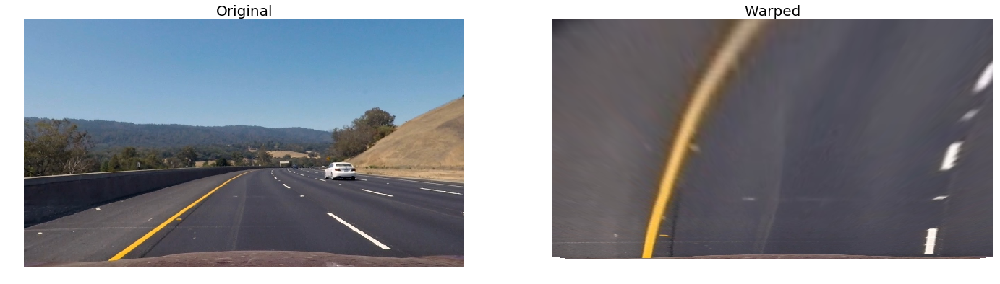

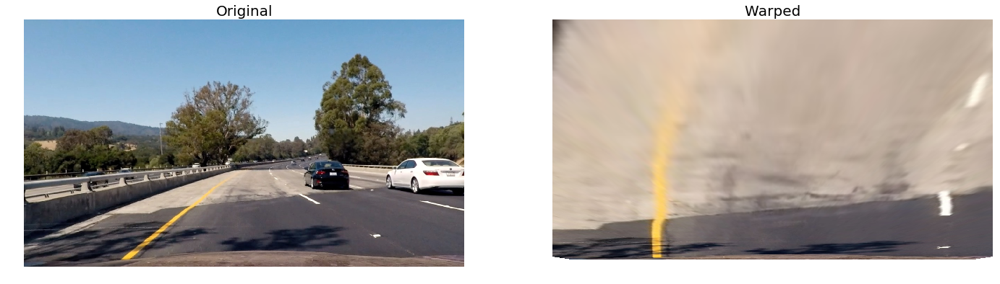

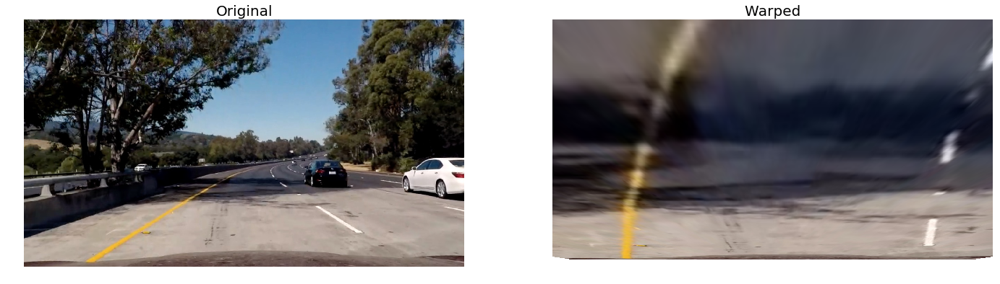

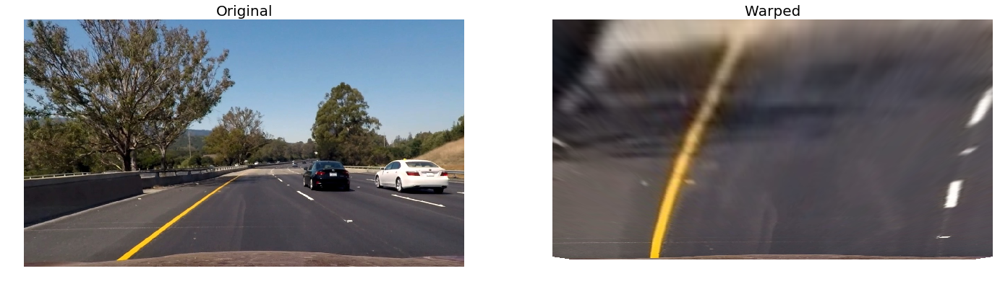

In [9]:
#iterate through all undistorted images
images = glob.glob('output_undistorted/*.jpg')
for image in images:
    filename = os.path.basename(image)
    img = mp.imread(image)
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    #plt.imshow(img)
    
    _, (x1, x2) = plt.subplots(1, 2, figsize=(24, 9))
    x1.axis('off')
    x1.imshow(img)
    x1.set_title('Original', fontsize=20)

    x2.axis('off')
    x2.imshow(warped)
    x2.set_title('Warped', fontsize=20)


# Find Polynominal Fit 

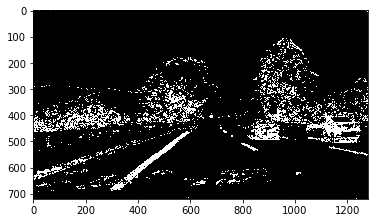

In [10]:
#read img
img = mp.imread("output_binary/test4.jpg")
# Warp image
#plt.fig()
plt.imshow(img)
binary_warped_1 = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
#plt.imshow(binary_warped_1)
binary_warped = cv2.cvtColor(binary_warped_1, cv2.COLOR_BGR2GRAY)

#plt.imshow(binary_warped)





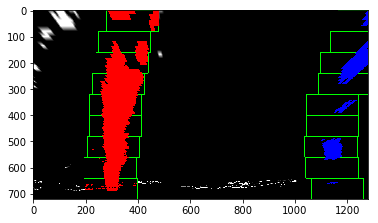

In [11]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img


out_img = fit_polynomial(binary_warped)

plt.imshow(out_img)

# Apply pipeline on all pictures

In [12]:
#iterate pipeline through all binary images
for image in glob.glob('output_binary/*.jpg'):
    filename = os.path.basename(image)
    img = mp.imread(image)
    binary_warped_1 = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    #plt.imshow(binary_warped_1)
    binary_warped = cv2.cvtColor(binary_warped_1, cv2.COLOR_BGR2GRAY)
    out_img = fit_polynomial(binary_warped)
    #plt.imshow(out_img)
    mp.imsave("output_binary_warped_color/"+filename, out_img)

for image in glob.glob('output_binary/*.jpg'):
    filename = os.path.basename(image)
    img = mp.imread(image)

    #show warped image
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

    #save the images
    mp.imsave("output_binary_warped/"+filename, warped)    


# Show found lanes on picture

In [13]:
#defining same function without drawing the boxes of the sliding window
def find_lane_pixels_woboxes(binary_warped):
    #determine a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    #find the peak of the left and right halves of the histogram
    #these will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    #define the number of sliding windows
    nwindows = 9
    #set the width of the windows +/- margin
    margin = 100
    #set minimum number of pixels found to recenter window
    minpix = 50

    #set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    #identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    #current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    #create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    #create empty lists to receive lower and upper boundaries of the estimated windows
    returnWindows_low = []
    returnWindows_high = []
    
    #step through the windows one by one
    for window in range(nwindows):
        #identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        win_xleft_low = leftx_current-margin
        win_xleft_high = leftx_current+margin
        win_xright_low = rightx_current-margin
        win_xright_high = rightx_current+margin
        
        #identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        #append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        #if you found > minpix pixels, recenter next window
        #(`right` or `leftx_current`) on their mean position
        if len(good_left_inds)>minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds)>minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    #concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    #extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return (leftx, lefty), (rightx, righty),


def fit_polynomial_woboxes(left, right, deg=2):
    #fit polynomial of degree deg to both lane markings
    try:
        left_fit = np.polyfit(left[1], left[0], deg)
    except:
        left_fit = None
    try:
        right_fit = np.polyfit(right[1], right[0], deg)
    except:
        right_fit = None
        
    if left_fit is None and right_fit is not None:
        left_fit = np.copy(right_fit)
        left_fit[-1] -= 800
        
    if left_fit is not None and right_fit is None:
        right_fit = np.copy(left_fit)
        right_fit[-1] += 800
        
    return left_fit, right_fit


    #return out_img

def visualize_polyfit(binary_warped, deg=2, colorize_markings=True, suppress_noise=False, colorize_lane=True):
    

    #determine the pixels belonging to the left and right marking
    left, right = find_lane_pixels_woboxes(binary_warped)
    #fit polynomial of degree deg to both lane markings
    left_fit, right_fit = fit_polynomial_woboxes(left, right, deg)
    
    #init output image
    if suppress_noise:
        #without the pixels which were identified as noise
        out_img = np.dstack((np.zeros_like(binary_warped), np.zeros_like(binary_warped), np.zeros_like(binary_warped)))
    else:
        #without all pixels
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    if colorize_markings:
        #colorize pixels belonging to the markings
        out_img[left[1], left[0]] = [255, 0, 0]
        out_img[right[1], right[0]] = [0, 0, 255]
    
    #if show_windows:
     #   add windows on top of the output_images
    #  for wind_low, wind_high in zip(returnWindows_low, returnWindows_high):
       #     cv2.rectangle(out_img, wind_low, wind_high, (0,255,0), 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    if deg==2:
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
    else:
        try:
            left_fitx = left_fit[0]*ploty**3 + left_fit[1]*ploty**2 + left_fit[2]*ploty + left_fit[3]
            right_fitx = right_fit[0]*ploty**3 + right_fit[1]*ploty**2 + right_fit[2]*ploty + right_fit[3]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty


    #change format of x and y points
    pts_l = []
    pts_r = []
    for x_l, x_r, y in zip(left_fitx, right_fitx, ploty):
        pts_l.append([x_l, y])
        pts_r.append([x_r, y])

    pts_l=np.int32(np.array([pts_l]))
    pts_r=np.int32(np.array([pts_r]))
    
    #plot fitted polynomials
    cv2.polylines(out_img, pts_l, False, (255, 255, 0), thickness=2)
    cv2.polylines(out_img, pts_r, False, (255, 255, 0), thickness=2)

    #colorize pixels inside the lane
    if colorize_lane:
        lane_mask = np.zeros_like(out_img)

        arr = []
        for el in pts_l[0]:
            arr.append(el)
        for el in np.flip(pts_r[0], 0):
            arr.append(el)
        
        arr = np.array([arr])
        
        cv2.fillPoly(lane_mask, arr, (0, 255, 255))
        cv2.addWeighted(out_img, 0.5, lane_mask, 0.2, 0.0, out_img)
        

    return out_img, left_fit, right_fit, ploty

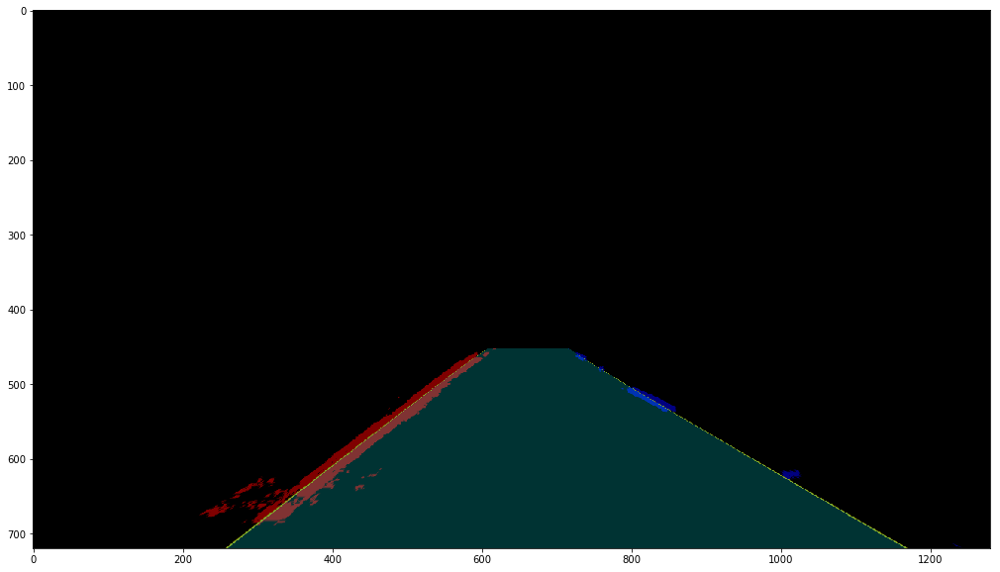

In [14]:
#load an example image
binary_warped = mp.imread("output_binary_warped/test4.jpg")[:,:,0]

#calculate image with fitted polynomials
out_img_noboxes, left, right, ploty = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, suppress_noise=True, colorize_lane=True)

#rewarp the image
rewarped_out_img = cv2.warpPerspective(out_img_noboxes, M_rev, (out_img_noboxes.shape[1], out_img_noboxes.shape[0]), flags=cv2.INTER_LINEAR)

#visualize the image
plt.figure(figsize=(20,10))
plt.imshow(rewarped_out_img)


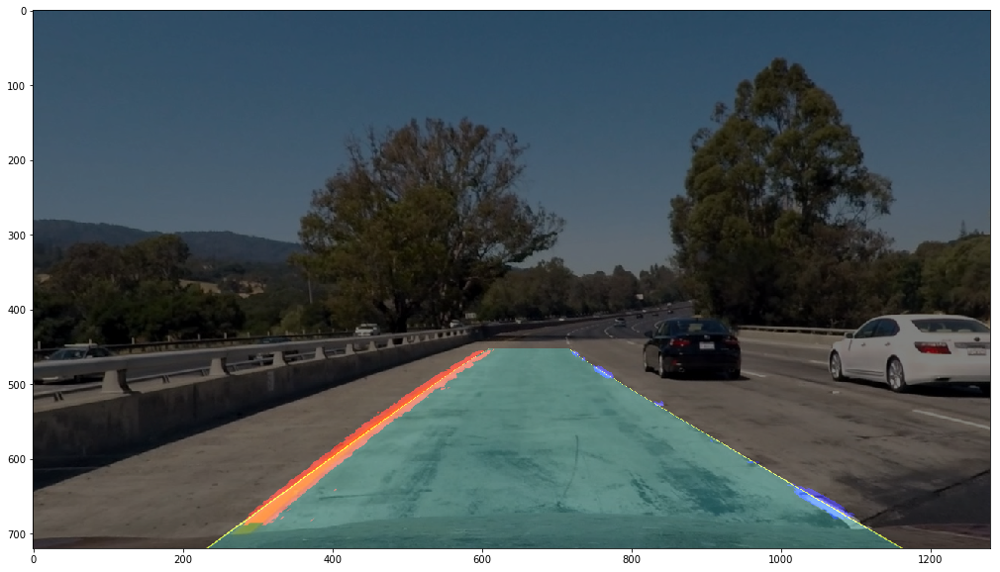

In [15]:
#load an example image
binary_warped = mp.imread("output_binary_warped/test1.jpg")[:,:,0]

#calculate image with fitted polynomials
out_img_noboxes, left, right, ploty = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, suppress_noise=True, colorize_lane=True)

#rewarp the image
rewarped_out_img = cv2.warpPerspective(out_img_noboxes, M_rev, (out_img_noboxes.shape[1], out_img_noboxes.shape[0]), flags=cv2.INTER_LINEAR)

orig_img = mp.imread("output_undistorted/test1.jpg")
conv = cv2.cvtColor(orig_img, cv2.COLOR_BGRA2BGR)

cv2.addWeighted(conv, 0.5, rewarped_out_img, 1.0, 0.0, conv)

#visualize the image
plt.figure(figsize=(20,10))
plt.imshow(conv)

# Calculate Lane Curvature

In [16]:
def measure_curvature_real(ploty, left_fit_cr, right_fit_cr):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
        
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)*ym_per_pix
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    #calculate the points belonging to the to lanes at the bottom of the image in meters
    x0_l = left_fit_cr[0]*y_eval**2 + left_fit_cr[1]*y_eval + left_fit_cr[2]
    x0_r = right_fit_cr[0]*y_eval**2 + right_fit_cr[1]*y_eval + right_fit_cr[2]
        
    #calculate the position of the lane center, the distances to the lane markings and the width of the lane
    lanecenter = x0_r-x0_l
    dist_lm = (np.abs(lanecenter-x0_l))*xm_per_pix
    dist_rm = (np.abs(lanecenter-x0_r))*xm_per_pix
    width = (x0_r-x0_l)*xm_per_pix
    
    #calculate the distance to the lane center accoriding ISO definition with positive values if the vehicle is 
    #on the left of the lane center and negative values if the vehicle is right to the lane center
    dist_cl = dist_rm - (width/2)
    
    return left_curverad, right_curverad, dist_cl

def text_distance_curvature (out_img, distance, left_curvature, right_curvature):
    
    #put the generated information as text overlay on the image
    cv2.putText(out_img,'Distance mid = '+str(np.round(distance,2))+'m', (100, 70), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)

    cv2.putText(out_img,'Radius of Left Curvature = '+str(np.round(left_curvature,2))+'m', (100, 120), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    
    cv2.putText(out_img,'Radius of Right Curvature = '+str(np.round(right_curvature,2))+'m', (100, 170), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
 
    
    return out_img

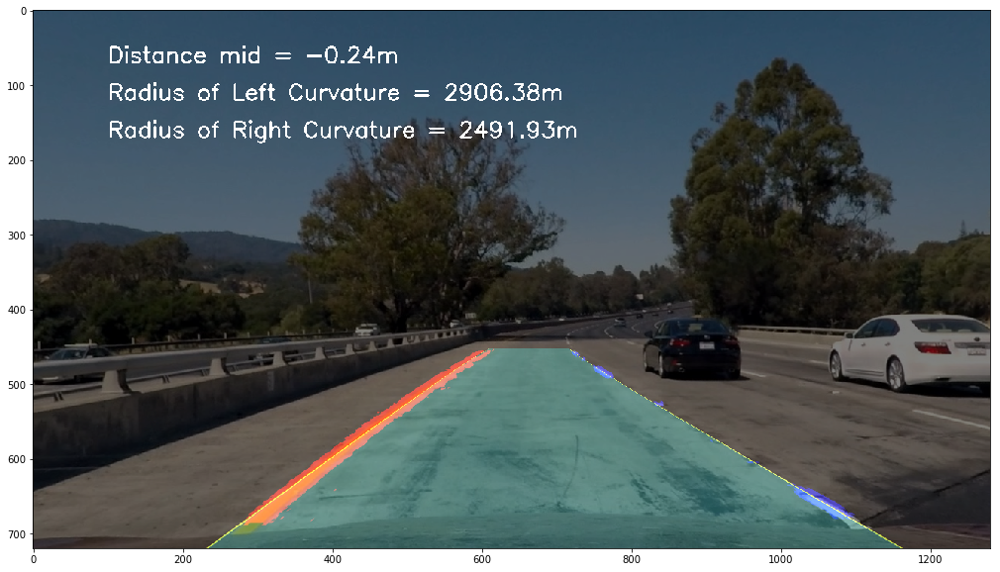

In [17]:
#load an example image
binary_warped = mp.imread("output_binary_warped/test1.jpg")[:,:,0]

#calculate image with fitted polynomials
out_img_noboxes, left, right, ploty = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, suppress_noise=True, colorize_lane=True)

#rewarp the image
rewarped_out_img = cv2.warpPerspective(out_img_noboxes, M_rev, (out_img_noboxes.shape[1], out_img_noboxes.shape[0]), flags=cv2.INTER_LINEAR)

orig_img = mp.imread("output_undistorted/test1.jpg")
conv = cv2.cvtColor(orig_img, cv2.COLOR_BGRA2BGR)

conv_combined = cv2.addWeighted(conv, 0.5, rewarped_out_img, 1.0, 0.0, conv)

left_curve, right_curve, distance_mid = measure_curvature_real(ploty, left, right)

conv_combined_text = text_distance_curvature(conv_combined, distance_mid, left_curve,right_curve)


#visualize the image
plt.figure(figsize=(20,10))
plt.imshow(conv_combined)

# Build pipeline for processing videos

In [18]:
# Import everything needed to edit/save/watch video clips
import imageio
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [25]:
def process_image(img):
    
    #distortion correction
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None) # use the points calculated in the step before
    undistort_color = cv2.undistort(img, mtx, dist, None, mtx)
    undistort = cv2.cvtColor(undistort_color, cv2.COLOR_BGR2RGB)
    
    #calculate gradients
    gradients = calculate_gradient(undistort)
    #get s_chanel
    s_channel = calculate_color_gradient(undistort)
    
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(gradients), gradients, s_channel)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(gradients)
    combined_binary[(s_channel == 1) | (gradients == 1)] = 1
    
    #warp picture
    binary_warped = cv2.warpPerspective(combined_binary, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
    
    #calculate image with fitted polynomials
    out_img_noboxes, left, right, ploty = visualize_polyfit(binary_warped, deg=2, colorize_markings=True, suppress_noise=True, colorize_lane=True)
    
    #rewarp the image
    rewarped_out_img = cv2.warpPerspective(out_img_noboxes, M_rev, (out_img_noboxes.shape[1], out_img_noboxes.shape[0]), flags=cv2.INTER_LINEAR)

    conv = cv2.cvtColor(undistort_color, cv2.COLOR_BGRA2BGR)
    
    img_undistort = np.copy(undistort_color)
    
    conv_combined = cv2.addWeighted(img_undistort, 0.5, rewarped_out_img, 1.0, 0.0, img_undistort)

    left_curve, right_curve, distance_mid = measure_curvature_real(ploty, left, right)

    conv_combined_text = text_distance_curvature(conv_combined, distance_mid, left_curve, right_curve)
    
    return conv_combined_text
    

In [24]:
white_output = 'video_output/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip1 = VideoFileClip("project_video.mp4").subclip(0,9)
#clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

error: OpenCV(4.2.0) C:\projects\opencv-python\opencv\modules\core\src\arithm.cpp:693: error: (-5:Bad argument) When the input arrays in add/subtract/multiply/divide functions have different types, the output array type must be explicitly specified in function 'cv::arithm_op'


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))